# Odd Result in Planck's Noise Simulations

There's something unexpected in Planck's noise simulations. It shows up most strongly for 545 and 857 GHz.

Contents:
- [100 GHz Simulations](#100-ghz-simulations)
- [545 GHz Simulations](#545-ghz-simulations)
- [857 GHz Simulations](#look-at-857-ghz)
- [353 GHz Simulations](#compare-to-353-ghz)
- [Similar effect in Half-mission difference maps](#half-mission-maps-contain-similar-phenomenon)
- [Impact](#impact-of-noise-signal-on-our-simulations)
    - [Impact on 100 GHz](#impact-100-ghz-results---as-expected): As Expected
    - [Impact on 545 GHz](#impact-545-ghz-results---over-correlated): Over-correlated
    - [Impact on 353 GHz](#impact-353-ghz-results---also-overcorrelated-sometimes): Sometimes over-correlated

## Boilerplate

In [1]:
import logging
import sys
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
import pysm3.units as u

from cmbml.utils.handle_data import (
    get_planck_obs_data, 
    get_planck_noise_data, 
    get_planck_hm_data, 
    get_map_dtype
    )
from cmbml.utils.fits_inspection import get_field_unit

from system_config import ASSETS_DIRECTORY, NOISE_DIRECTORY

In [2]:
# Logging was helpful when debugging my handle_data module
logging.basicConfig(
    level=logging.WARNING,  # If DEBUG, there's a bunch of PySM3 and Matplotlib stuff
    format='%(levelname)s - %(message)s',
    handlers=[logging.StreamHandler(sys.stdout)]
)

In [3]:
def plot_many_ps(ps_s,
            title=None, 
            x_low=0.7,
            x_high=1e4,
            y_low=1e-4,
            y_high=1e-2,
            styles=None,
            labels=None,
            white_noise_expected=None,
            legend=True,
            focus_first=False):
    y_label="$N_{\\ell}$" + f"({ps_s[0].unit:latex_inline})"
    x_label="$\\ell$"
    plt.figure()
    for i, ps in enumerate(ps_s):
        ells = np.arange(len(ps)).astype(float)
        if x_low < 1:
            ells[0] = x_low
        style=None
        linewidth=None
        color=None
        if styles is None:
            pass
        elif styles[i] != "-":
            style = styles[i]
            linewidth = 2
        else:
            style = styles[i]
            linewidth = 1
        if focus_first and i == 0:
            color='black'
            linewidth=3
        label = None if labels is None else labels[i]
        plt.plot(ells, ps, label=label, linestyle=style, color=color, linewidth=linewidth)
    # if white_noise_expected is not None:
    #     plt.axhline(y=white_noise_expected, color='black', linestyle='--', linewidth=1)
    #     plt.text(y=white_noise_expected, x=x_high, s="$\\sigma_{\\ell}=" + f"{white_noise_expected:.1e}$", 
    #              color='black',
    #              horizontalalignment='right', verticalalignment='bottom')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.xscale('log')
    plt.yscale('log')
    plt.xlim([x_low-0.00001, x_high])
    plt.ylim([y_low, y_high])
    plt.title(title)
    if legend:
        plt.legend()
    plt.show()

# 100 GHz Simulations

For reference, here's what I've been seeing a lot working with Planck's noise simulations.

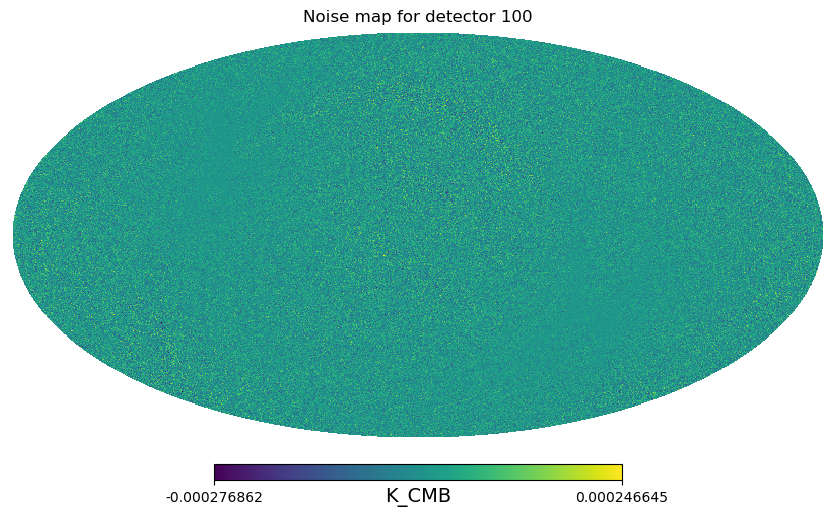

In [4]:
det100 = 100
nse_fn = get_planck_noise_data(detector=det100, assets_directory=NOISE_DIRECTORY, realization=0)
nse_unit = get_field_unit(nse_fn, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
nse_map = hp.read_map(nse_fn, field=0)
hp.mollview(nse_map, unit=nse_unit, title=f'Noise map for detector {det100}')

# 545 GHz Simulations

In [5]:
det545 = 545
# Get observations
obs_fn = get_planck_obs_data(detector=det545, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=det545, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=det545, assets_directory=NOISE_DIRECTORY, realization=1)
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
obs_unit, nse_unit

(Unit("MJy / sr"), Unit("MJy / sr"))

We plot the simulation noise with a scale such that the (expected) background noise is visible.

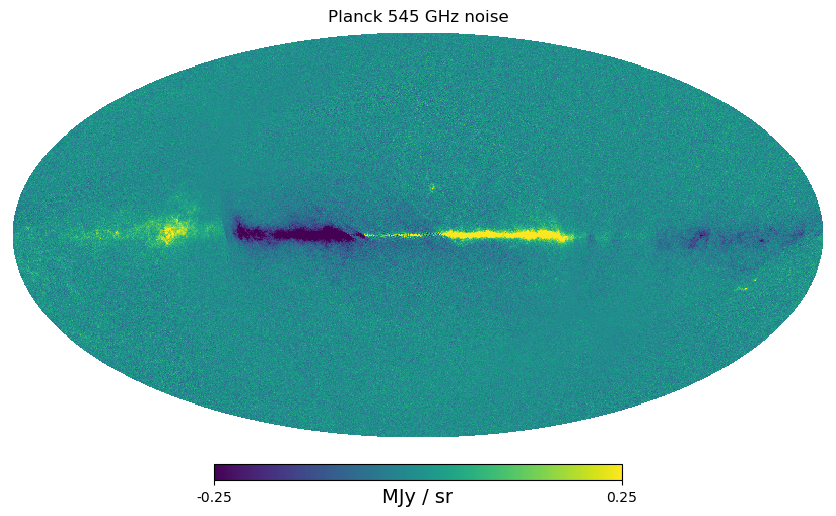

In [6]:
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)
hp.mollview(nse0, title=f'Planck {det545} GHz noise', **moll_plot_params|min_max)

A larger scale is needed to view the observations. Viewed this way I wonder if noise is even relevant for these detectors.

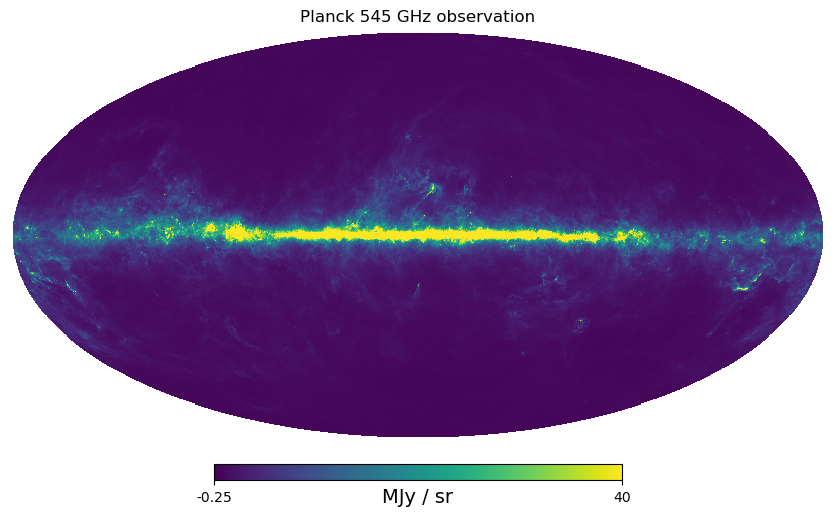

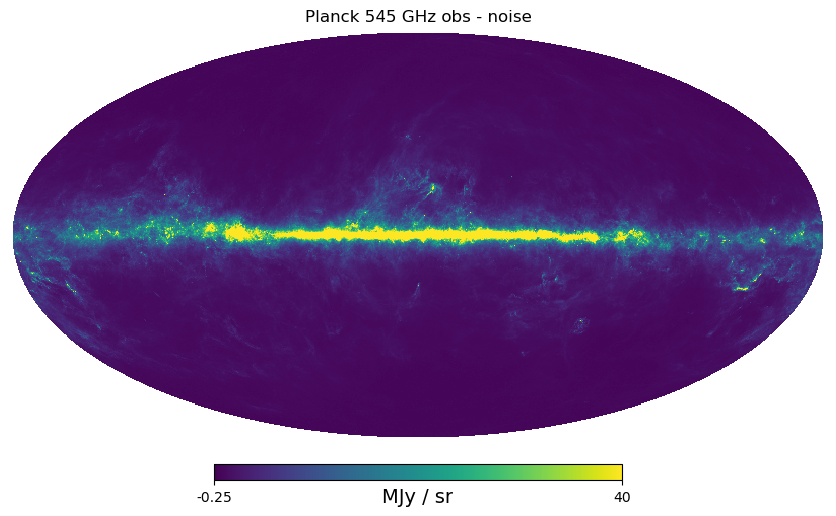

In [7]:
min_max2 = dict(min=-0.25, max=40)
hp.mollview(obs, title=f'Planck {det545} GHz observation', **moll_plot_params|min_max2)
hp.mollview(obs - nse0, title=f'Planck {det545} GHz obs - noise', **moll_plot_params|min_max2)

When we zoom in, it does reveal some minor difference (and if my eyes can see it, the math certainly will). Compare especially regions that appear flat.

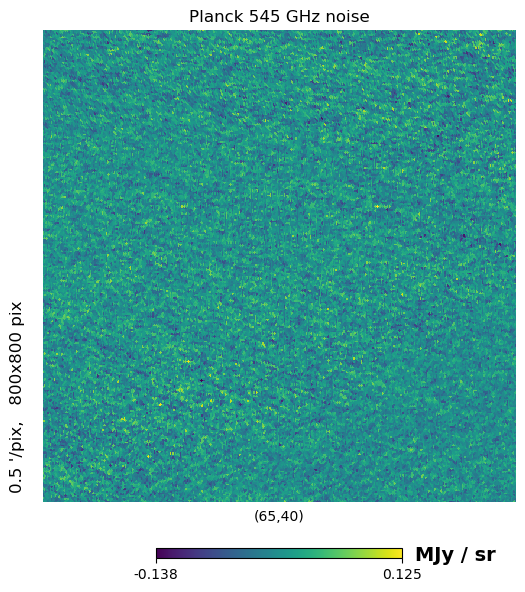

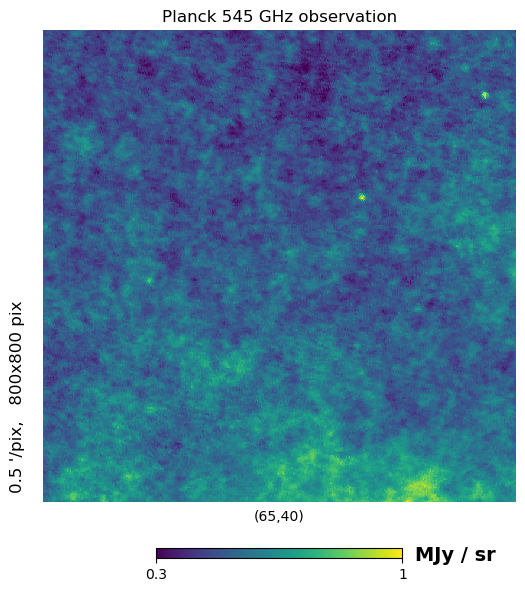

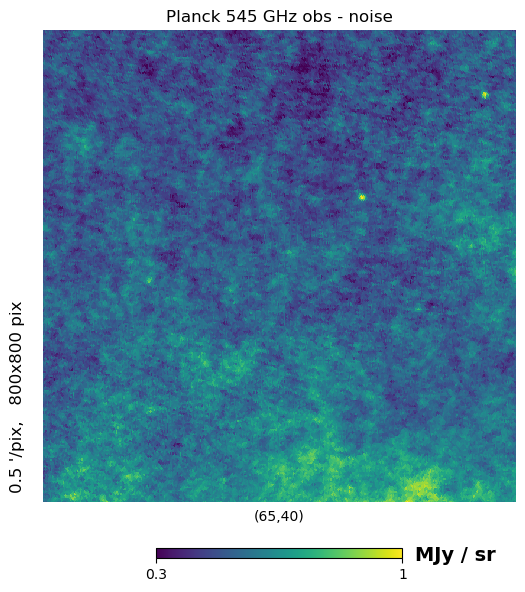

In [8]:
gnom_plot_params = dict(rot=[65, 40, 0], unit=obs_unit, reso=0.5, xsize=800)
min_max = dict(min=0.3, max=1)
hp.gnomview(nse0, title=f'Planck {det545} GHz noise', **gnom_plot_params)
hp.gnomview(obs, title=f'Planck {det545} GHz observation', **{**min_max,  **gnom_plot_params})
hp.gnomview(obs - nse0, title=f'Planck {det545} GHz obs - noise', **{**min_max, **gnom_plot_params})

# 857 GHz Simulation

We see less than was in 545, but still some stuff.

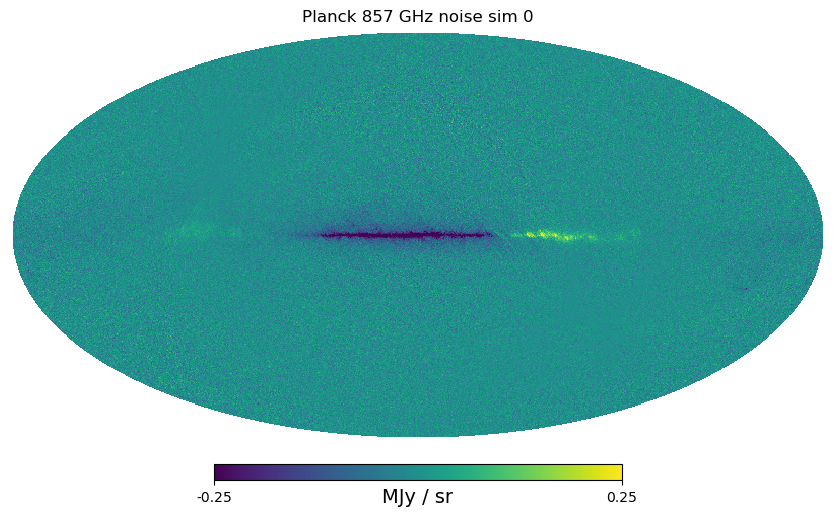

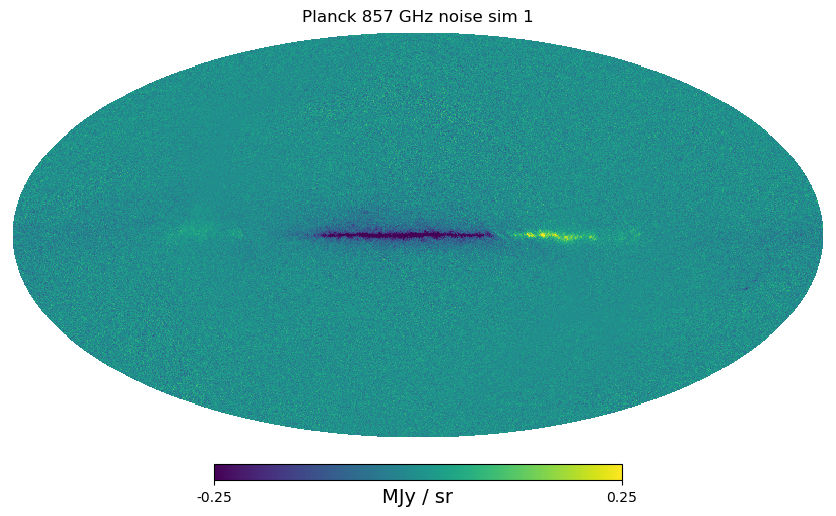

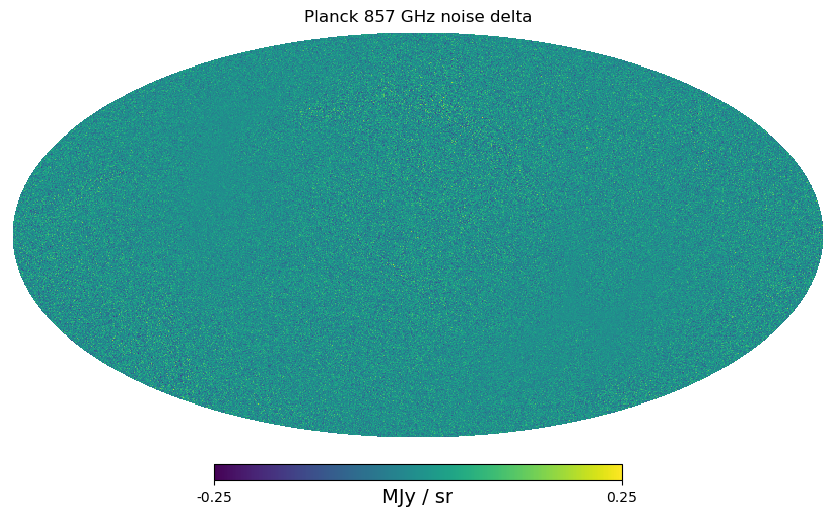

In [9]:
# Get observations
det857 = 857
# Get filenames
obs_fn = get_planck_obs_data(detector=det857, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=det857, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=det857, assets_directory=NOISE_DIRECTORY, realization=1)
# Load maps
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
# Get map units
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
# Setup and plot maps
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)
# min_max = dict(min=-0.1, max=0.1)
hp.mollview(nse0, title=f'Planck {det857} GHz noise sim 0', **moll_plot_params|min_max)
hp.mollview(nse1, title=f'Planck {det857} GHz noise sim 1', **moll_plot_params|min_max)
hp.mollview(nse1 - nse0, title=f'Planck {det857} GHz noise delta', **moll_plot_params|min_max)

# Compare to 353 GHz

At 353, we do see ***some*** galactic stuff, but apparently only sometimes (it surprised me when I did this). Maybe the fixed signal is a dampening around the galactic plane. We see it only when the mean noise across all the sky is similar to this galactic "signal".

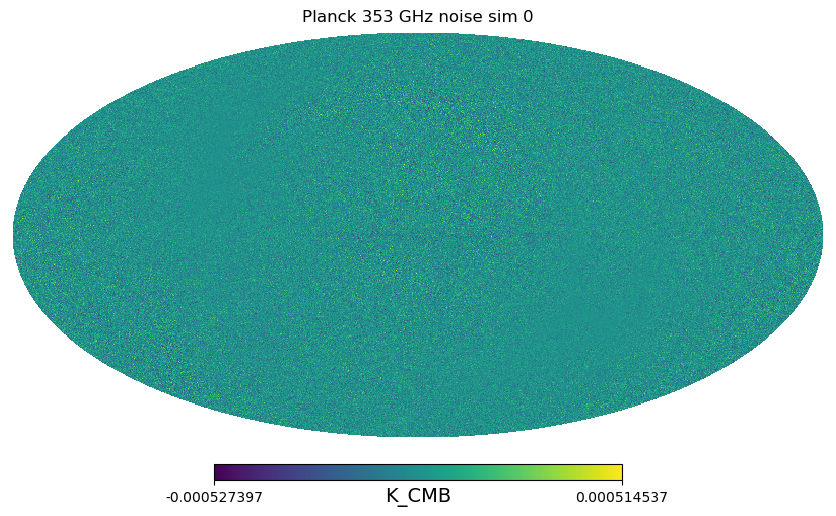

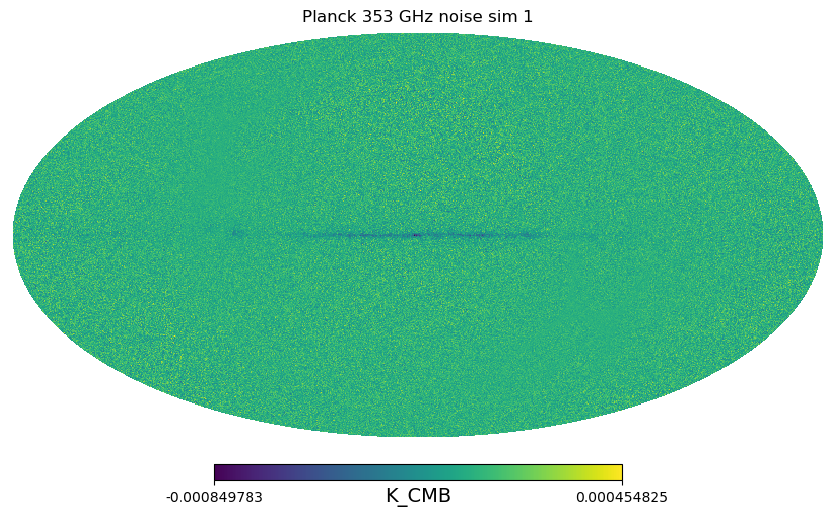

In [10]:
# Get observations
det353 = 353
# Get filenames
obs_fn = get_planck_obs_data(detector=det353, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=det353, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=det353, assets_directory=NOISE_DIRECTORY, realization=1)
# Load maps
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
# Get map units
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
# Setup and plot maps
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=None, max=None)
# min_max = dict(min=-0.1, max=0.1)
hp.mollview(nse0, title=f'Planck {det353} GHz noise sim 0', **moll_plot_params|min_max)
hp.mollview(nse1, title=f'Planck {det353} GHz noise sim 1', **moll_plot_params|min_max)
# hp.mollview(nse1 - nse0, title=f'Planck {DET} GHz noise delta', **moll_plot_params|min_max)

# Half-mission Maps contain similar phenomenon

There is something that shows up around these areas for the Half-mission maps. It's ... alternatively very large or small in these maps. I guess in the simulations they know it's uniform?

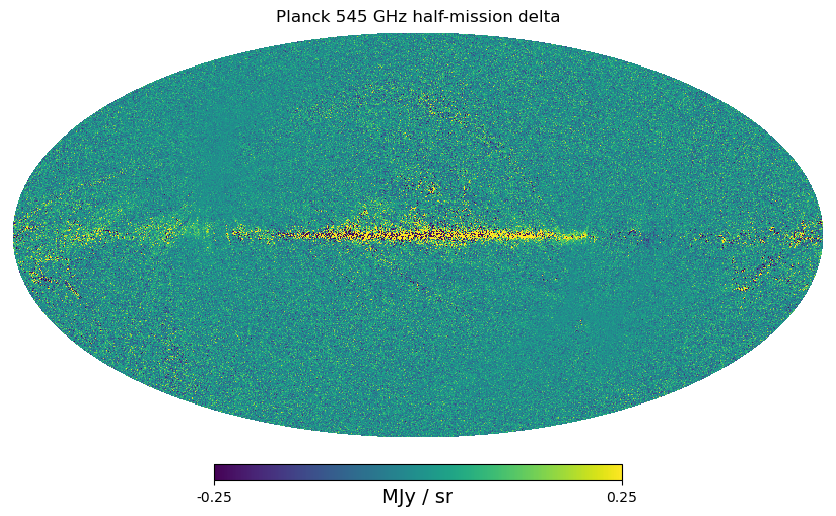

In [11]:
det545 = 545
hm545a_fn, hm545b_fn = get_planck_hm_data(det545, assets_directory=ASSETS_DIRECTORY, progress=True)
hm545a = hp.read_map(hm545a_fn)
hm545b = hp.read_map(hm545b_fn)

obs_unit = get_field_unit(hm545a_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
obs_unit, nse_unit

moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)

# hp.mollview(hm545a, title=f'Planck {det545} GHz half-mission 1', **moll_plot_params|min_max)
# hp.mollview(hm545b, title=f'Planck {det545} GHz half-mission 2', **moll_plot_params|min_max)
hp.mollview(hm545b - hm545a, title=f'Planck {det545} GHz half-mission delta', **moll_plot_params|min_max)

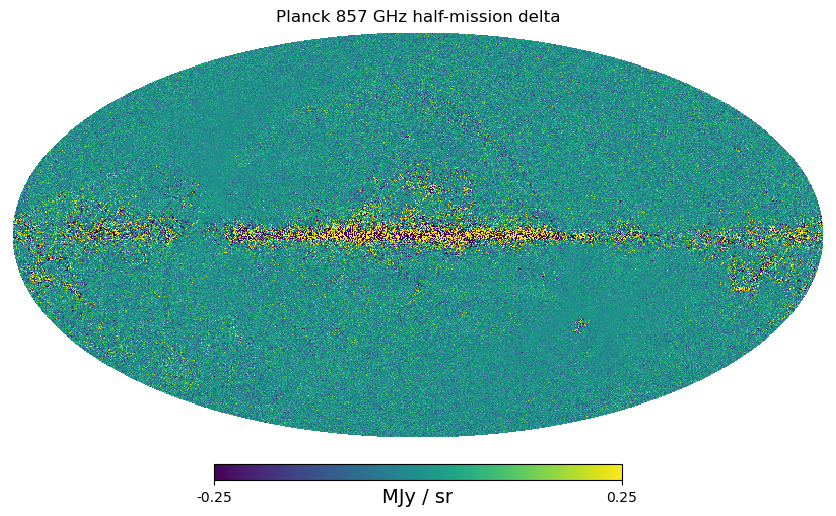

In [12]:
det857 = 857
hm857a_fn, hm857b_fn = get_planck_hm_data(det857, assets_directory=ASSETS_DIRECTORY, progress=True)
hm857a = hp.read_map(hm857a_fn)
hm857b = hp.read_map(hm857b_fn)

min_max = dict(min=-0.25, max=0.25)

# hp.mollview(hm857a, title=f'Planck {det857} GHz half-mission 1', **moll_plot_params|min_max)
# hp.mollview(hm857b, title=f'Planck {det857} GHz half-mission 2', **moll_plot_params|min_max)
hp.mollview(hm857b - hm857a, title=f'Planck {det857} GHz half-mission delta', **moll_plot_params|min_max)

# (SKIP THIS) Impact of Noise Signal

### 100 GHz Double-Simulated Map (SKIP THIS)

First I show what happens when we simulate 100 GHz noise in this way - it looks as expected. There's a bunch of code cells here; it's just the simulation method spread out. I've cleaned it up below.

In [13]:
CENTER_FREQS = {
    30: 28.4 * u.GHz,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    44: 44.1 * u.GHz,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    70: 70.4 * u.GHz,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    100: 100.89 * u.GHz,   # Value from Planck DeltaBandpassTable
    143: 142.876 * u.GHz,  # Value from Planck DeltaBandpassTable
    217: 221.156 * u.GHz,  # Value from Planck DeltaBandpassTable
    353: 357.5 * u.GHz,    # Value from Planck DeltaBandpassTable
    545: 555.2 * u.GHz,    # Value from Planck DeltaBandpassTable
    857: 866.8 * u.GHz,    # Value from Planck DeltaBandpassTable
}

In [14]:
def get_xxcov_field_num(detector, field_str):
    if detector not in [30, 44, 70, 100, 143, 217, 353, 545, 857]:
        raise ValueError(f"Detector {detector} not recognized")
    field_str = field_str.lower()
    lower_field_nums = dict(ii=4, iq=5, iu=6, qq=7, qu=8, uu=9)
    upper_field_nums = dict(ii=2)  # These detectors only have intensity data
    if detector in [545, 857]:
        if field_str not in upper_field_nums.keys():
            raise ValueError(f"Field {field_str} not available for detector {detector}")
        res = upper_field_nums[field_str]
    else:
        if field_str not in ['ii', 'iq', 'iu', 'qq', 'qu', 'uu']:
            raise ValueError(f"Field {field_str} not available for detector {detector}")
        res = lower_field_nums[field_str]
    return res

In [15]:
def _change_variance_map_resolution(m, nside_out):
    # For variance maps, because statistics
    power = 2

    # From PySM3 template.py's read_map function, with minimal alteration (added 'power'):
    m_dtype = get_map_dtype(m)
    nside_in = hp.get_nside(m)
    if nside_out < nside_in:  # do downgrading in double precision, per healpy instructions
        m = hp.ud_grade(m.astype(np.float64), power=power, nside_out=nside_out)
    elif nside_out > nside_in:
        m = hp.ud_grade(m, power=power, nside_out=nside_out)
    m = m.astype(m_dtype, copy=False)
    # End of used portion

    return m

In [16]:
def get_unit_from_str(unit_str):
    if unit_str in ['uK_CMB']:
        return u.uK_CMB
    elif unit_str in ['Kcmb', 'K_CMB']:
        return u.K_CMB
    elif unit_str in ['MJy/sr']:
        return u.MJy / u.sr
    else:
        raise ValueError(f"Unit {unit_str} not recognized")

def get_sqrt_unit_from_str(unit_str):
    if unit_str in ['Kcmb^2', '(K_CMB)^2', 'K_CMB^2']:
        return u.K_CMB
    elif unit_str in ['uK_CMB^2', '(uK_CMB)^2']:
        return u.uK_CMB
    elif unit_str in ['(MJy/sr)^2', '(Mjy/sr)^2', 'MJy/sr^2']:
        return u.MJy / u.sr
    else:
        raise ValueError(f"Unit {unit_str} not recognized")

In [17]:
def get_scale_map(det, nside_out):
    obs_fn = get_planck_obs_data(detector=det, assets_directory=ASSETS_DIRECTORY)
    use_field = get_xxcov_field_num(det, 'II')
    II_cov_map = hp.read_map(obs_fn, hdu=1, field=use_field)
    II_cov_map_512 = _change_variance_map_resolution(II_cov_map, nside_out)
    scale_map = np.sqrt(II_cov_map_512)

    var_map_unit = get_field_unit(obs_fn, hdu=1, field_idx=use_field)
    var_map_unit = get_sqrt_unit_from_str(var_map_unit)
    scale_map = scale_map * var_map_unit
    scale_map = u.Quantity(scale_map, unit=var_map_unit)

    return scale_map

In [18]:
def make_sim_noise_params(det):
    data = np.load(f"noise_models/noise_model_{det}GHz.npz")

    src_mean_ps     = data['mean_ps']
    src_components  = data['components']
    src_variance    = data['variance']

    src_mean_maps   = data['maps_mean']
    src_sd_maps     = data['maps_sd']
    src_map_unit    = data['maps_unit']

    num_components = len(src_variance)

    std_devs = np.sqrt(src_variance)
    reduced_samples = np.random.normal(0, std_devs, (num_components,))

    # Reconstruct power spectra in log10 space
    tgt_log_ps = reduced_samples @ src_components + src_mean_ps

    # Convert out of log10 space
    tgt_cls = 10**tgt_log_ps

    src_map_unit = get_unit_from_str(src_map_unit)

    return tgt_cls, src_mean_maps, src_sd_maps, src_map_unit

In [19]:
det100 = 100
NSIDE_OUT = 512
SEED = 42
np.random.seed(SEED)  # Just in case; set seed for reproducibility

lmax = 3*NSIDE_OUT-1
scale_map = get_scale_map(det100, NSIDE_OUT)
rng = np.random.default_rng(SEED)
wht_nse_map = rng.normal(size=scale_map.size) * scale_map

In [20]:
tgt_cl, tgt_dist_means, tgt_dist_sds, tgt_unit = make_sim_noise_params(det100)
print(f"tgt_unit is {tgt_unit}, wht_nse_map.unit is {wht_nse_map.unit}")

tgt_unit is K_CMB, wht_nse_map.unit is K_CMB


In [21]:
# Reverse sign of white noise map if needed
tgt_mean     = np.random.normal(tgt_dist_means, tgt_dist_sds) * tgt_unit
tgt_sign     = np.sign(tgt_mean)

wht_mean      = wht_nse_map.mean()
wht_sign      = np.sign(wht_mean)

if wht_sign != tgt_sign:
    wht_nse_map = -wht_nse_map

In [22]:
# if wht_nse_map.unit == u.K_CMB:
#     wht_nse_map = wht_nse_map.to(u.uK_CMB)

In [23]:
# Filter map
assert tgt_unit == wht_nse_map.unit, f"tgt_unit is {tgt_unit}, wht_nse_map.unit is {wht_nse_map.unit}"

wht_nse_alms = hp.map2alm(wht_nse_map, lmax=lmax)
wht_nse_cl = hp.alm2cl(wht_nse_alms)

map_filter = np.sqrt(tgt_cl[:lmax+1] / wht_nse_cl)
filtered_alms = hp.almxfl(wht_nse_alms, map_filter)
filtered_map = hp.alm2map(filtered_alms, nside=NSIDE_OUT) * tgt_unit

In [24]:
# Adjust monopole if needed
min_dist_t = (tgt_dist_means - 3*tgt_dist_sds) * tgt_unit
max_dist_t = (tgt_dist_means + 3*tgt_dist_sds) * tgt_unit
tgt_mean     = np.random.normal(tgt_dist_means, tgt_dist_sds) * tgt_unit
tgt_sign     = np.sign(tgt_mean)

if filtered_map.mean() < min_dist_t or filtered_map.mean() > max_dist_t:
    _adjusted_map = filtered_map + tgt_mean - filtered_map.mean()
    filtered_map = _adjusted_map

In [25]:
# Get noise map cl for comparison
nse_fn0 = get_planck_noise_data(detector=det100, assets_directory=NOISE_DIRECTORY, realization=0)
src_nse_map = hp.read_map(nse_fn0)
src_nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
src_nse_unit = get_unit_from_str(src_nse_unit)

src_nse_map = src_nse_map * src_nse_unit
if src_nse_map.unit == u.K_CMB:
    src_nse_map = src_nse_map.to(u.uK_CMB)
src_nse_cl = hp.anafast(src_nse_map, lmax=lmax)

In [26]:
tgt_cl = tgt_cl * tgt_unit**2
wht_nse_cl_K = wht_nse_cl * wht_nse_map.unit**2
tgt_nse_cl_uK = tgt_cl.to(u.uK_CMB**2, equivalencies=u.cmb_equivalencies(CENTER_FREQS[det100]))
wht_nse_cl_uK = wht_nse_cl_K.to(u.uK_CMB**2, equivalencies=u.cmb_equivalencies(CENTER_FREQS[det100]))
filtered_cl = hp.anafast(filtered_map.to(u.uK_CMB, equivalencies=u.cmb_equivalencies(CENTER_FREQS[det100])), lmax=lmax)

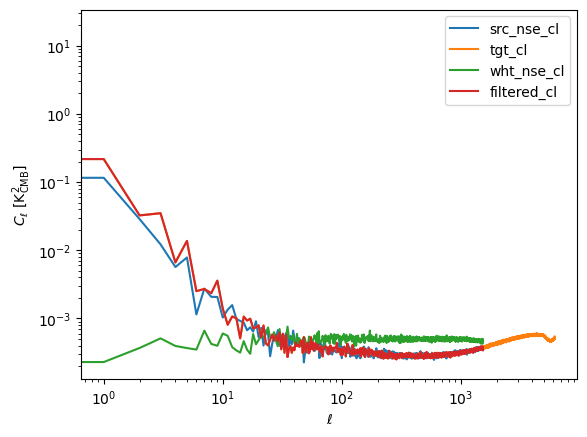

In [27]:
# filtered_cl = hp.anafast(filtered_map)
plt.plot(src_nse_cl, label='src_nse_cl')
plt.plot(tgt_nse_cl_uK, label='tgt_cl')
plt.plot(wht_nse_cl_uK, label='wht_nse_cl')
plt.plot(filtered_cl, label='filtered_cl')
plt.loglog()
plt.legend()
plt.xlabel('$\\ell$')
plt.ylabel('$C_\\ell$' + f' [{tgt_unit*tgt_unit:latex_inline}]')
plt.show()

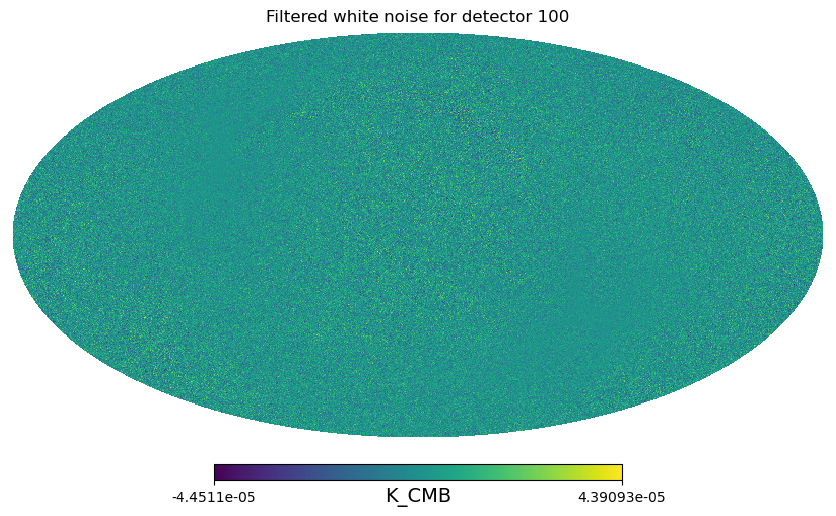

In [28]:
hp.mollview(filtered_map, unit=scale_map.unit, title=f'Filtered white noise for detector {det100}')

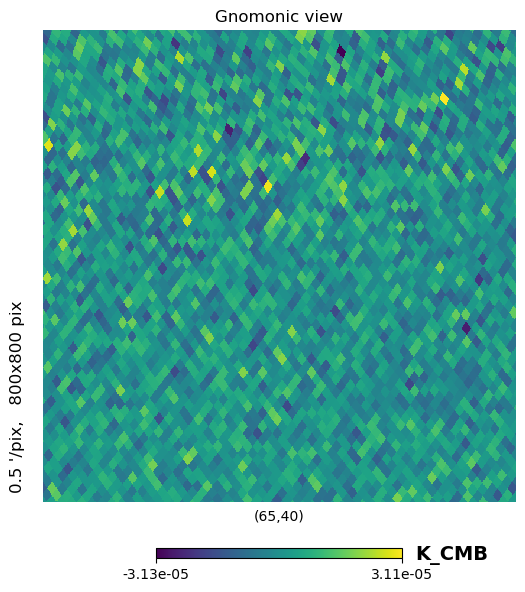

In [29]:
hp.gnomview(filtered_map, rot=[65, 40, 0], unit=scale_map.unit, reso=0.5, xsize=800)

# Impact of Noise Signal on our Simulations

### Single Method code

In [30]:
NSIDE_OUT = 512
SEED = 42

def test_filter_noise_map(detector, src_nse_realization=0, 
                          show_gnom=False, show_moll=True, show_src=False):
    # Set parameters
    np.random.seed(SEED)
    lmax = 3*NSIDE_OUT-1
    rng = np.random.default_rng(SEED)

    # Get target noise parameters
    tgt_cl, tgt_dist_means, tgt_dist_sds, tgt_unit = make_sim_noise_params(detector)
    tgt_cl = tgt_cl * tgt_unit**2
    min_dist_t = (tgt_dist_means - 3*tgt_dist_sds)              * tgt_unit  # outside this range, adjust monopole
    max_dist_t = (tgt_dist_means + 3*tgt_dist_sds)              * tgt_unit
    tgt_mean   = np.random.normal(tgt_dist_means, tgt_dist_sds) * tgt_unit
    tgt_sign   = np.sign(tgt_mean)

    # Make aniso white noise map
    scale_map = get_scale_map(detector, NSIDE_OUT)
    wht_nse_map = rng.normal(size=scale_map.size) * scale_map

    # Check for unit consistency (both target and white should be in source units, either K_CMB or MJy/sr)
    assert tgt_unit == wht_nse_map.unit, f"Stopping. tgt_unit is {tgt_unit}, wht_nse_map.unit is {wht_nse_map.unit}"

    # Reverse sign of aniso white noise map if needed
    wht_mean  = wht_nse_map.mean()
    wht_sign  = np.sign(wht_mean)
    if wht_sign != tgt_sign:
        wht_nse_map = -wht_nse_map

    # Make map filter
    wht_nse_alms  = hp.map2alm(wht_nse_map, lmax=lmax)
    wht_nse_cl    = hp.alm2cl(wht_nse_alms) * wht_nse_map.unit**2
    map_filter    = np.sqrt(tgt_cl[:lmax+1] / wht_nse_cl)

    # Filter map
    filtered_alms = hp.almxfl(wht_nse_alms, map_filter)
    filtered_map  = hp.alm2map(filtered_alms, nside=NSIDE_OUT) * tgt_unit
    filtered_cl   = hp.anafast(filtered_map, lmax=lmax) * filtered_map.unit**2

    # Adjust monopole if needed
    if filtered_map.mean() < min_dist_t or filtered_map.mean() > max_dist_t:
        filtered_map = filtered_map + tgt_mean - filtered_map.mean()

    ###############################################
    # Done! The remainder is for display purposes #
    ###############################################

    # Get noise map cl for comparison
    nse_fn0      = get_planck_noise_data(detector=detector, 
                                         assets_directory=NOISE_DIRECTORY, 
                                         realization=src_nse_realization)
    src_nse_map  = hp.read_map(nse_fn0)
    src_nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
    src_nse_unit = get_unit_from_str(src_nse_unit)
    src_nse_map  = src_nse_map * src_nse_unit

    # Convert units to uK_CMB if they were K_CMB
    if src_nse_map.unit == u.K_CMB:
        wht_nse_map = wht_nse_map.to(u.uK_CMB, equivalencies=u.cmb_equivalencies(CENTER_FREQS[detector]))
        wht_nse_cl  = hp.anafast(wht_nse_map, lmax=lmax) * wht_nse_map.unit**2

        src_nse_map = src_nse_map.to(u.uK_CMB, equivalencies=u.cmb_equivalencies(CENTER_FREQS[detector]))
        src_nse_cl  = hp.anafast(src_nse_map, lmax=lmax) * src_nse_map.unit**2

        tgt_cl      = tgt_cl.to(u.uK_CMB**2, equivalencies=u.cmb_equivalencies(CENTER_FREQS[detector]))

        filtered_map = filtered_map.to(u.uK_CMB, equivalencies=u.cmb_equivalencies(CENTER_FREQS[detector]))
        filtered_cl  = filtered_cl.to(u.uK_CMB**2, equivalencies=u.cmb_equivalencies(CENTER_FREQS[detector]))
    else:
        src_nse_cl = hp.anafast(src_nse_map, lmax=lmax) * src_nse_map.unit**2

    # Check for unit consistency in power spectra output
    ps_unit = wht_nse_cl.unit
    assert ps_unit == tgt_cl.unit, f"Stopping. ps_unit is {ps_unit}, tgt_cl.unit is {tgt_cl.unit}"
    assert ps_unit == src_nse_cl.unit, f"Stopping. ps_unit is {ps_unit}, src_nse_cl.unit is {src_nse_cl.unit}"
    assert ps_unit == filtered_cl.unit, f"Stopping. ps_unit is {ps_unit}, filtered_cl.unit is {filtered_cl.unit}"

    # Display output
    plot_many_ps([
                  tgt_cl[:lmax+1], 
                  src_nse_cl, 
                  wht_nse_cl, 
                  filtered_cl],
                 labels=[
                     'Target', 
                     f'Source Ex {src_nse_realization:04d}', 
                     'White', 
                     'Filtered'
                     ],
                 title=f'Simulation noise spectra for {detector}',
                 y_low=None, y_high=None,
                 x_low=0.7, x_high=1500,
                 focus_first=True
                 )

    # Display maps
    if show_moll:
        hp.mollview(filtered_map, unit=scale_map.unit, title=f'Filtered white noise for detector {detector}')
        plt.show()

    if show_gnom:
        hp.gnomview(filtered_map, rot=[65, 40, 0], title=f'Filtered white noise for detector {detector}', unit=scale_map.unit, reso=0.5, xsize=800)
        plt.show()

    if show_src:
        if show_moll:
            hp.mollview(src_nse_map, unit=src_nse_unit, 
                        title=f'Source noise for detector {detector}, num {src_nse_realization}')
            plt.show()
        if show_gnom:
            hp.gnomview(src_nse_map, rot=[65, 40, 0], unit=src_nse_unit, reso=0.5, xsize=800, 
                        title=f'Source noise for detector {detector}, num {src_nse_realization}')
            plt.show()

## Impact: 100 GHz Results - As Expected

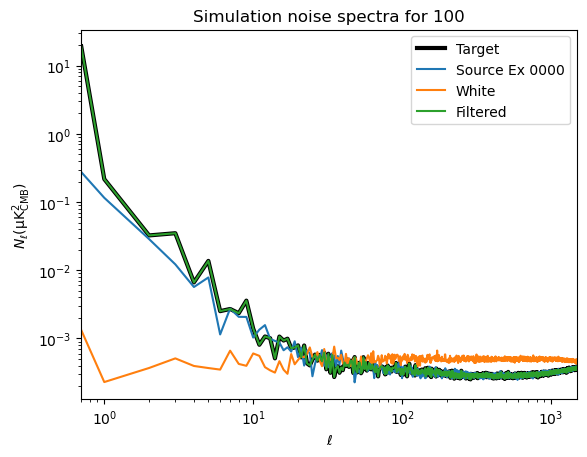

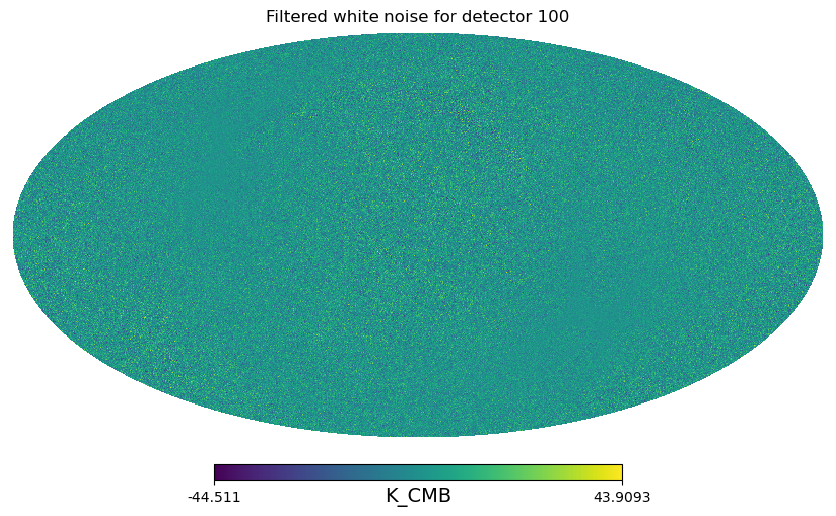

In [31]:
test_filter_noise_map(detector=100)

## Impact: 545 GHz Results - Over-Correlated

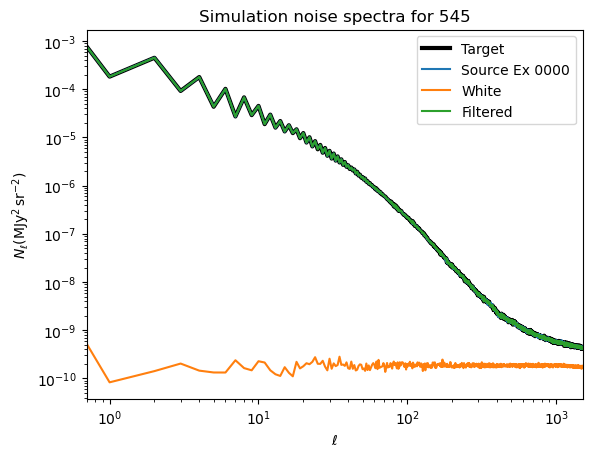

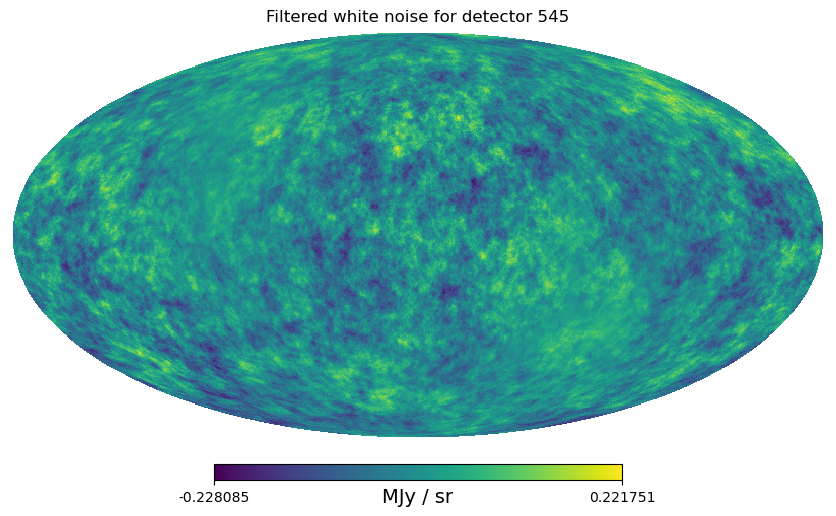

In [32]:
test_filter_noise_map(detector=545)

## Impact: 353 GHz Results - Also Overcorrelated, Sometimes.

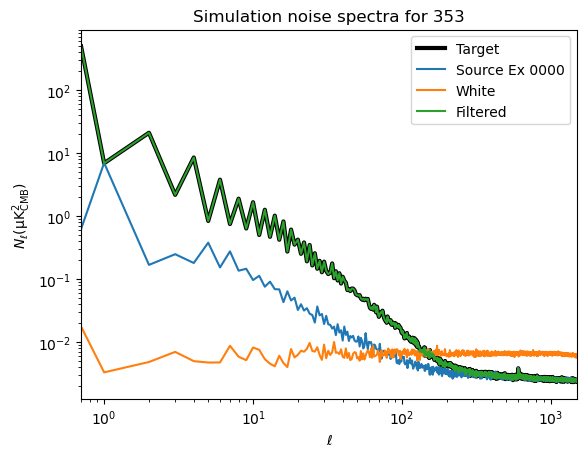

In [33]:
test_filter_noise_map(detector=353, src_nse_realization=0, show_gnom=False, show_moll=False, show_src=False)

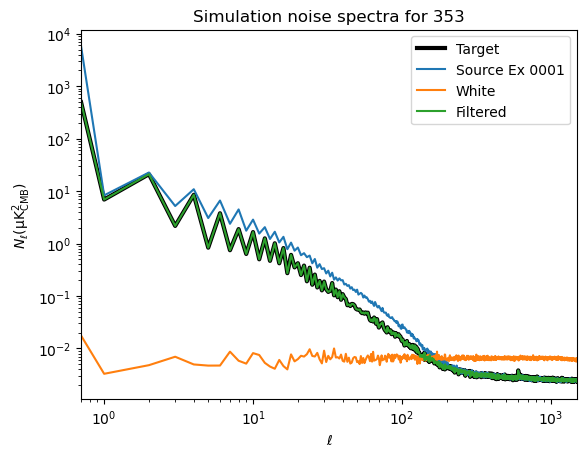

In [34]:
test_filter_noise_map(detector=353, src_nse_realization=1, show_gnom=False, show_moll=False, show_src=False)

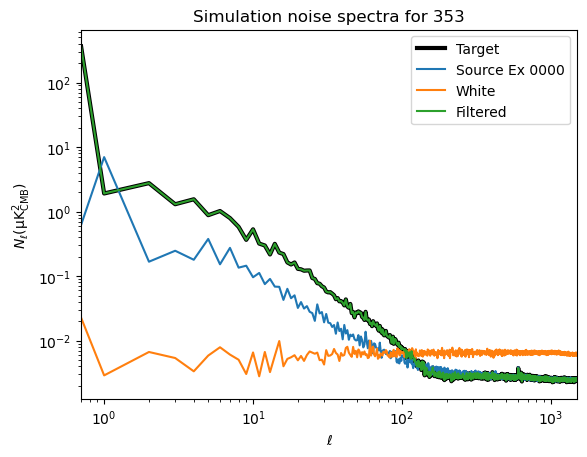

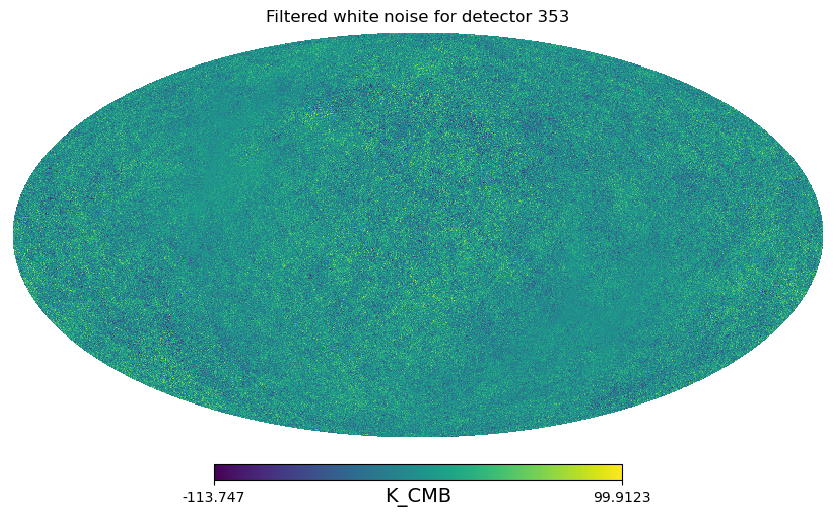

In [35]:
SEED = 2
test_filter_noise_map(detector=353, src_nse_realization=0, show_gnom=False, show_moll=True, show_src=False)

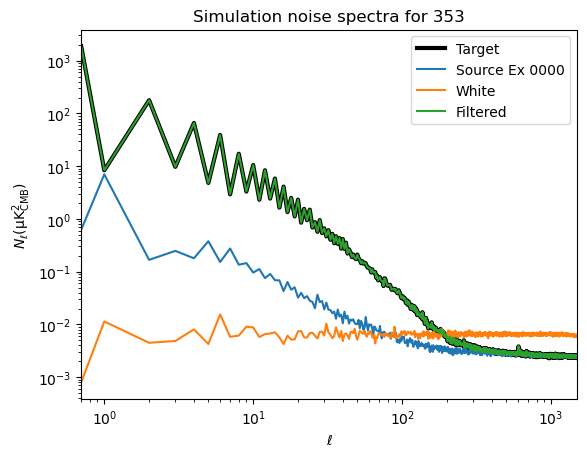

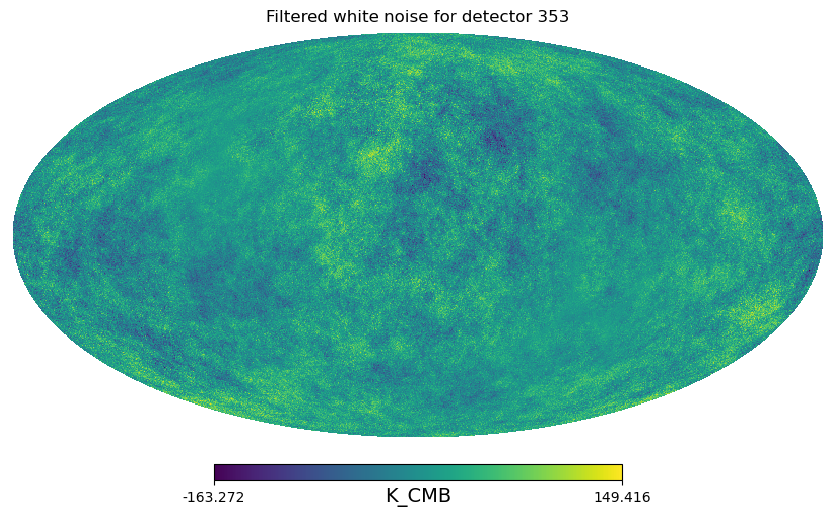

In [36]:
SEED = 0
test_filter_noise_map(detector=353, src_nse_realization=0, show_gnom=False, show_moll=True, show_src=False)